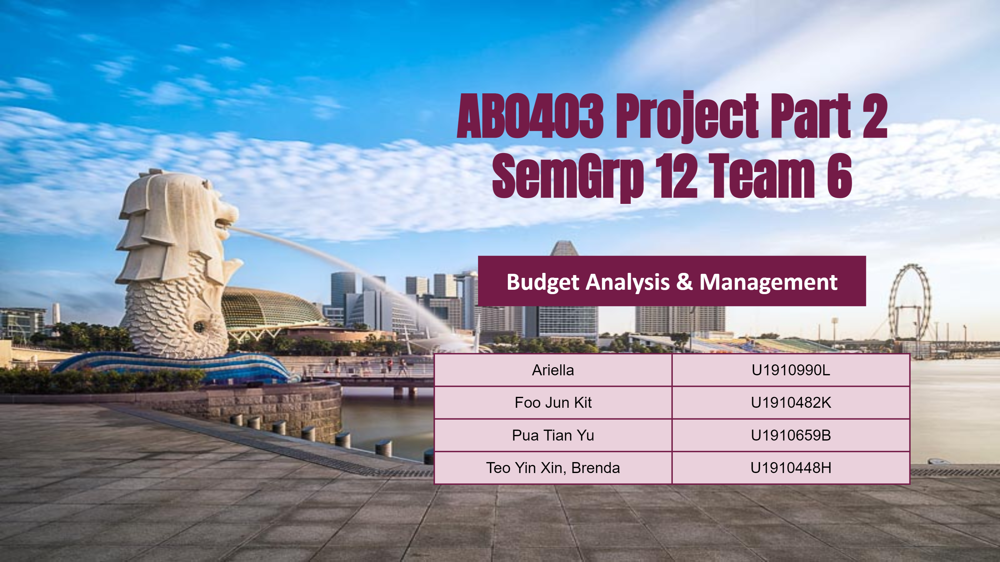

# Import Modules:

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from matplotlib.pyplot import figure

# Reading CSV Files

In [17]:
exp_by_type =pd.read_csv("government-expenditure-by-type.csv")
exp_by_type.head()

,financial_year,actual_revised_estimated,type,category,class,amount
0,1997,Actual,Operating,Running Cost,Expenditure on Manpower,3063
1,1998,Actual,Operating,Running Cost,Expenditure on Manpower,2896
2,1999,Actual,Operating,Running Cost,Expenditure on Manpower,2872
3,2000,Actual,Operating,Running Cost,Expenditure on Manpower,3276
4,2001,Actual,Operating,Running Cost,Expenditure on Manpower,3351


In [18]:
govt_manpower = pd.read_csv("government-manpower.csv")
govt_manpower.head()

,financial_year,actual_revised_estimated,ministry,number
0,1997,Actual,Attorney-General's Chambers,185.0
1,1998,Actual,Attorney-General's Chambers,212.0
2,1999,Actual,Attorney-General's Chambers,209.0
3,2000,Actual,Attorney-General's Chambers,212.0
4,2001,Actual,Attorney-General's Chambers,255.0


In [19]:
fiscal_position =pd.read_csv("government-fiscal-position.csv")
fiscal_position.head()

,year_of_balance,actual_revised_estimated,category,item,amount,percent_of_gdp
0,1997,Actual,Revenue,Operating Revenue,29181,0.195
1,1998,Actual,Revenue,Operating Revenue,27911,0.197
2,1999,Actual,Revenue,Operating Revenue,30645,0.203
3,2000,Actual,Revenue,Operating Revenue,31439,0.186
4,2001,Actual,Revenue,Operating Revenue,28496,0.178


In [20]:
operating_revenue =pd.read_csv("government-operating-revenue.csv")
operating_revenue.head()

,financial_year,actual_revised_estimated,class,type,amount,percent_of_gdp
0,1997,Actual,Tax,Corporate Income Tax,6809,0.045
1,1998,Actual,Tax,Corporate Income Tax,6256,0.044
2,1999,Actual,Tax,Corporate Income Tax,6565,0.044
3,2000,Actual,Tax,Corporate Income Tax,8316,0.049
4,2001,Actual,Tax,Corporate Income Tax,7821,0.049


In [21]:
total_expenditure =pd.read_csv("government-total-expenditure.csv")
total_expenditure.head()

,financial_year,actual_revised_estimated,sector,ministry,type,amount,percent_of_gdp
0,1997,Actual,Social Development,Education,Operating,3348,0.022
1,1998,Actual,Social Development,Education,Operating,3167,0.022
2,1999,Actual,Social Development,Education,Operating,3257,0.022
3,2000,Actual,Social Development,Education,Operating,4277,0.025
4,2001,Actual,Social Development,Education,Operating,4767,0.030


# Question 1: How is the overall picture of Singapore’s Fiscal Position like over the years?

## Plotting Bar Chart for Primary/Basic/Overall Balance from 1997-2021

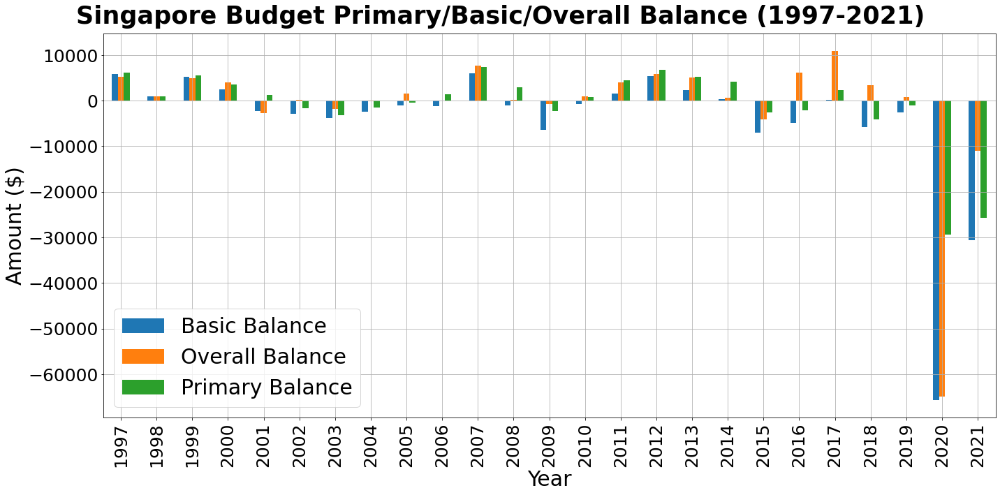

In [22]:
df = fiscal_position[(fiscal_position["item"]=="Primary Balance")|(fiscal_position["item"]=="Overall Balance")|(fiscal_position["item"]=="Basic Balance")]
df = df[["year_of_balance","item","amount"]]
df = df.pivot("year_of_balance","item","amount")
df.plot(kind="bar",fontsize=12,figsize=(20,10),grid=True)
plt.suptitle("Singapore Budget Primary/Basic/Overall Balance (1997-2021)", fontsize = 35, weight="bold")
plt.xlabel("Year", fontsize = 30)
plt.ylabel("Amount ($)", fontsize = 30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.legend(loc="lower left",fontsize=30)
plt.tight_layout();

In [23]:
# Finding unique category names
df = fiscal_position[["year_of_balance","category","amount"]]
print(df["category"].unique())
df.head()

['Revenue' 'Expenditure' 'Balance']


,year_of_balance,category,amount
0,1997,Revenue,29181
1,1998,Revenue,27911
2,1999,Revenue,30645
3,2000,Revenue,31439
4,2001,Revenue,28496


## Plotting Line Graph: Singapore's Fiscal Position

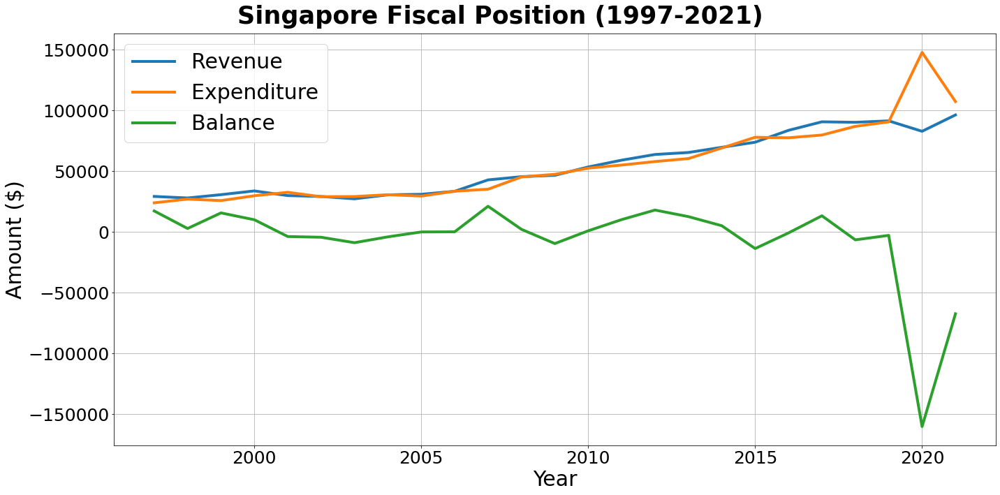

In [24]:
plt.figure(figsize=(20,10))
x1 = df[df["category"]=="Revenue"]["year_of_balance"].unique()
y1 = df[df["category"]=="Revenue"].groupby("year_of_balance").sum()
x2 = df[df["category"]=="Expenditure"]["year_of_balance"].unique()
y2 = df[df["category"]=="Expenditure"].groupby("year_of_balance").sum()
x3 = df[df["category"]=="Balance"]["year_of_balance"].unique()
y3 = df[df["category"]=="Balance"].groupby("year_of_balance").sum()
plt.plot(x1, y1, x2, y2, x3, y3, linewidth=4)
plt.suptitle("Singapore Fiscal Position (1997-2021)",fontsize=35,weight="bold")
plt.xlabel("Year",fontsize=30)
plt.ylabel("Amount ($)",fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.legend(["Revenue","Expenditure","Balance"],fontsize=30)
plt.grid()
plt.tight_layout();

In [25]:
fiscal_position.head()

,year_of_balance,actual_revised_estimated,category,item,amount,percent_of_gdp
0,1997,Actual,Revenue,Operating Revenue,29181,0.195
1,1998,Actual,Revenue,Operating Revenue,27911,0.197
2,1999,Actual,Revenue,Operating Revenue,30645,0.203
3,2000,Actual,Revenue,Operating Revenue,31439,0.186
4,2001,Actual,Revenue,Operating Revenue,28496,0.178


In [26]:
items = (fiscal_position["item"].unique())
print(items)

['Operating Revenue' 'Net Investment Income/Returns Contribution'
 'Total Expenditure'
 'Special Transfers Excluding Top-ups to Endowment and Trust Funds'
 'Top-ups to Endowment and Trust Funds' 'Primary Balance' 'Basic Balance'
 'Overall Balance']


In [27]:
# Number of years with Basic Balance DEFICIT
balance_items = items[-3:]
for item in balance_items:
    count = fiscal_position[(fiscal_position["item"]==item) & (fiscal_position["amount"]<0)].shape[0]
    print("There are {} years where {} is in deficit.".format(count,item))

There are 11 years where Primary Balance is in deficit.
There are 15 years where Basic Balance is in deficit.
There are 8 years where Overall Balance is in deficit.


# Question 2: Has the operating expenditure(s) been increased or decreased over the years? Why?

## Plotting Line Graph: Government Expenditure by Type

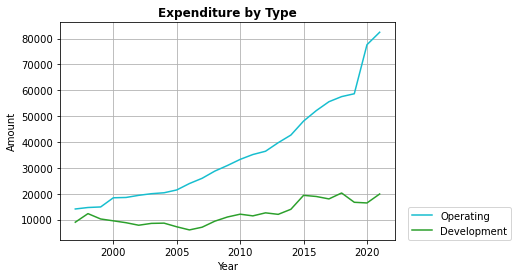

In [28]:
operating_type = exp_by_type[exp_by_type["type"] == "Operating"].groupby("financial_year")["amount"].sum()
development_type = exp_by_type[exp_by_type["type"] == "Development"].groupby("financial_year")["amount"].sum()

p = np.array(exp_by_type["financial_year"])
x_axis=np.unique(p)

plt.plot(x_axis,operating_type, label="Operating",color="tab:cyan")
plt.plot(x_axis,development_type, label="Development",color="tab:green")

plt.title("Expenditure by Type",fontweight="bold")
plt.xlabel('Year')
plt.ylabel('Amount')
plt.legend(loc=(1.04,0))
plt.grid()
#plt.savefig('expenditure_type.png',bbox_inches="tight") #Save chart as image
plt.show()


##### Based on the general trend as observed in the line graph above, the government's operating expenditure as a whole has increased over the years.

## Plotting Line Graph: Operating Expenditure by Category

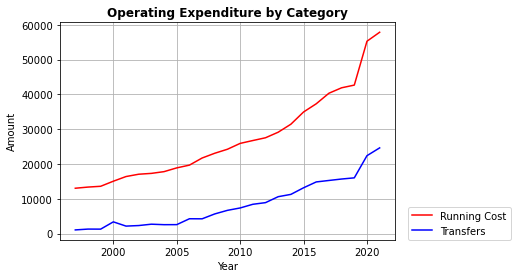

In [29]:
operating_cat1 = exp_by_type[exp_by_type["category"] == "Running Cost"].groupby("financial_year")["amount"].sum()
operating_cat2 = exp_by_type[exp_by_type["category"] == "Transfers"].groupby("financial_year")["amount"].sum()

p = np.array(exp_by_type["financial_year"])
x_axis=np.unique(p)

plt.plot(x_axis,operating_cat1, label="Running Cost",color="red")
plt.plot(x_axis,operating_cat2, label="Transfers",color="blue")

plt.title("Operating Expenditure by Category",fontweight="bold")
plt.xlabel('Year')
plt.ylabel('Amount')
plt.legend(loc=(1.04,0))
plt.grid()
#plt.savefig('expenditure_class.png',bbox_inches="tight") #Save chart as image
plt.show()

## Plotting Line Graph: Operating Expenditure by Class

In [30]:
#Expenditure on Manpower Class Data
EOM_class = exp_by_type[exp_by_type["class"] == "Expenditure on Manpower"].groupby("financial_year")["amount"].sum()

#Other Operating Expenditure Class Data
OOE_class = exp_by_type[exp_by_type["class"] == "Other Operating Expenditure"].groupby("financial_year")["amount"].sum()

#Grants, Subventions & Capital Injections to Organisations Class Data
GSC_class = exp_by_type[exp_by_type["class"] == "Grants, Subventions & Capital Injections to Organisations"].groupby("financial_year")["amount"].sum()

# Social Transfers Class Data
ST_class = exp_by_type[exp_by_type["class"] == "Social Transfers"].groupby("financial_year")["amount"].sum()

#Transfers to Institutions & Organisations Class Data
TIO_class = exp_by_type[exp_by_type["class"] == "Transfers to Institutions & Organisations"].groupby("financial_year")["amount"].sum()

#International Organisations & Overseas Development Assistance Class Data
IOO_class = exp_by_type[exp_by_type["class"] == "International Organisations & Overseas Development Assistance"].groupby("financial_year")["amount"].sum()

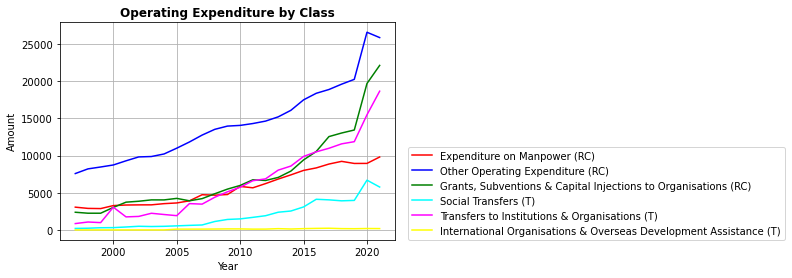

In [31]:
p = np.array(exp_by_type["financial_year"])
x_axis=np.unique(p)

plt.plot(x_axis,EOM_class, label="Expenditure on Manpower (RC)",color="red")
plt.plot(x_axis,OOE_class, label="Other Operating Expenditure (RC)",color="blue")
plt.plot(x_axis,GSC_class, label="Grants, Subventions & Capital Injections to Organisations (RC)",color="green")
plt.plot(x_axis,ST_class, label="Social Transfers (T)",color="cyan")
plt.plot(x_axis,TIO_class, label="Transfers to Institutions & Organisations (T)",color="magenta")
plt.plot(x_axis,IOO_class, label="International Organisations & Overseas Development Assistance (T)",color="yellow")

plt.title("Operating Expenditure by Class",fontweight="bold")
plt.xlabel('Year')
plt.ylabel('Amount')
plt.legend(loc=(1.04,0))
plt.grid()
#plt.savefig('expenditure_class.png',bbox_inches="tight") #Save chart as image
plt.show()

### Additional: Plotting line graphs for each individual classes of operating expenditure

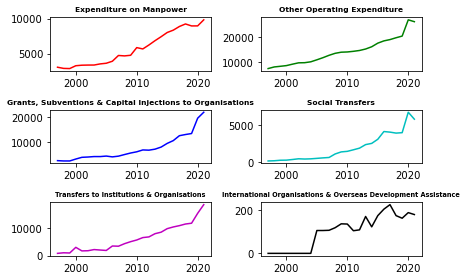

In [32]:
fig1, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2)
fig1

ax1

ax1.plot(x_axis, EOM_class, 'r-')
ax1.set_title('Expenditure on Manpower',fontsize=7.5,fontweight="bold")

ax2.plot(x_axis, OOE_class, 'g-')
ax2.set_title('Other Operating Expenditure',fontsize=7.5,fontweight="bold")

ax3.plot(x_axis, GSC_class, 'b-')
ax3.set_title('Grants, Subventions & Capital Injections to Organisations',fontsize=7.5,fontweight="bold")

ax4.plot(x_axis, ST_class, 'c-')
ax4.set_title('Social Transfers',fontsize=7.5,fontweight="bold")

ax5.plot(x_axis, TIO_class, 'm-')
ax5.set_title('Transfers to Institutions & Organisations',fontsize=6.5,fontweight="bold")

ax6.plot(x_axis, IOO_class, 'k-')
ax6.set_title('International Organisations & Overseas Development Assistance',fontsize=6.5,fontweight="bold")

plt.tight_layout()
#plt.savefig('expenditure_class_individual.png',bbox_inches="tight") #Save chart as image
plt.show()

##### Generally, all classes of operating expenditure have been on an increasing trend. However, the overall increase in operating expenditure is largely due to the increase in Other Operating Expenditure and Grants, Subventions & Capital Injections to Organisations. (See Poster for further analysis)

# Question 3: How is the Revenue Income of Singapore like? Any significant change(s) over the years?

## Plotting Line Graph: Operating Revenue Per FY

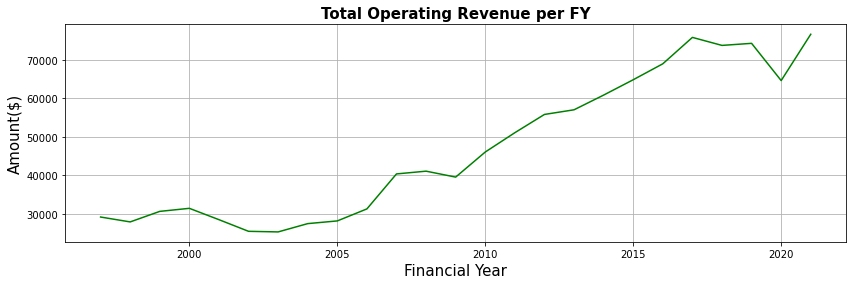

In [33]:
operating_revenue.groupby("financial_year")["amount"].sum().plot(linestyle = 'solid',figsize=(14,4), color=["green"])
plt.title("Total Operating Revenue per FY", fontsize = 15, fontweight= "bold")
plt.xlabel("Financial Year", fontsize = 15)
plt.ylabel("Amount($)", fontsize = 15)
plt.grid();

## Plotting Line Graph: Operating Revenue by Class

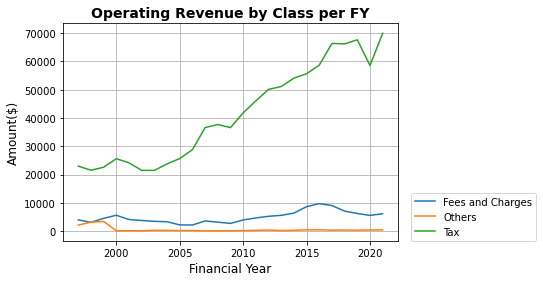

In [34]:
operating_revenue.groupby(["financial_year","class"])["amount"].sum().unstack().plot(linestyle = "solid")
plt.title("Operating Revenue by Class per FY", fontsize = 14, fontweight = "bold")
plt.xlabel("Financial Year", fontsize = 12)
plt.ylabel("Amount($)", fontsize = 12)
plt.legend(loc=(1.04,0))
plt.grid();

## Plotting Line Graph: Operating Revenue by Type (Tax)

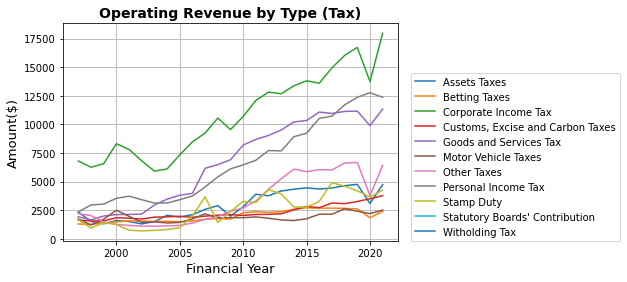

In [35]:
plt.plot(operating_revenue[operating_revenue["type"]=="Assets Taxes"]["financial_year"],operating_revenue[operating_revenue["type"]=="Assets Taxes"]["amount"], label = "Assets Taxes", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Betting Taxes"]["financial_year"],operating_revenue[operating_revenue["type"]=="Betting Taxes"]["amount"], label = "Betting Taxes", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Corporate Income Tax"]["financial_year"],operating_revenue[operating_revenue["type"]=="Corporate Income Tax"]["amount"], label = "Corporate Income Tax", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Customs, Excise and Carbon Taxes"]["financial_year"],operating_revenue[operating_revenue["type"]=="Customs, Excise and Carbon Taxes"]["amount"], label = "Customs, Excise and Carbon Taxes", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Goods and Services Tax"]["financial_year"],operating_revenue[operating_revenue["type"]=="Goods and Services Tax"]["amount"], label = "Goods and Services Tax", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Motor Vehicle Taxes"]["financial_year"],operating_revenue[operating_revenue["type"]=="Motor Vehicle Taxes"]["amount"], label = "Motor Vehicle Taxes", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Other Taxes"]["financial_year"],operating_revenue[operating_revenue["type"]=="Other Taxes"]["amount"], label = "Other Taxes", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Personal Income Tax"]["financial_year"],operating_revenue[operating_revenue["type"]=="Personal Income Tax"]["amount"], label = "Personal Income Tax", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Stamp Duty"]["financial_year"],operating_revenue[operating_revenue["type"]=="Stamp Duty"]["amount"], label = "Stamp Duty", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Statutory Boards' Contribution"]["financial_year"],operating_revenue[operating_revenue["type"]=="Statutory Boards' Contribution"]["amount"], label = "Statutory Boards' Contribution", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Witholding Tax"]["financial_year"],operating_revenue[operating_revenue["type"]=="Witholding Tax"]["amount"], label = "Witholding Tax", linestyle = 'solid')

plt.xlabel("Financial Year", fontsize = 13)
plt.ylabel("Amount($)", fontsize = 13)
plt.title("Operating Revenue by Type (Tax)", fontsize = 14, fontweight = "bold")
plt.grid()
plt.legend(loc=(1.04,0))
plt.show()

## Plotting Line Graph: Operating Revenue by Type (Fees and Charges & Others)

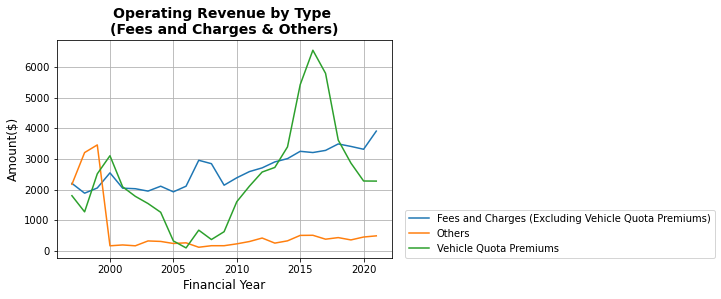

In [36]:
plt.plot(operating_revenue[operating_revenue["type"]=="Fees and Charges (Excluding Vehicle Quota Premiums)"]["financial_year"],operating_revenue[operating_revenue["type"]=="Fees and Charges (Excluding Vehicle Quota Premiums)"]["amount"], label = "Fees and Charges (Excluding Vehicle Quota Premiums)", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Others"]["financial_year"],operating_revenue[operating_revenue["type"]=="Others"]["amount"], label = "Others", linestyle = 'solid')
plt.plot(operating_revenue[operating_revenue["type"]=="Vehicle Quota Premiums"]["financial_year"],operating_revenue[operating_revenue["type"]=="Vehicle Quota Premiums"]["amount"], label = "Vehicle Quota Premiums", linestyle = 'solid')

plt.xlabel("Financial Year", fontsize = 12)
plt.ylabel("Amount($)", fontsize = 12)
plt.title("Operating Revenue by Type \n(Fees and Charges & Others)", fontsize = 14, fontweight = "bold")
plt.grid()
plt.legend(loc=(1.04,0))
plt.show()

# Question 4: Which sector(s) has been developed more? Or less? Any impacts you can observe from past years’ expenditure?

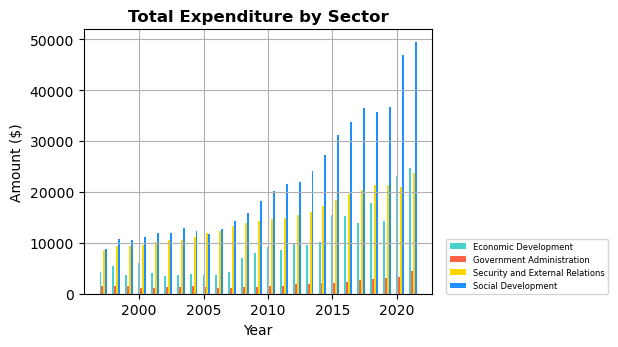

In [37]:
x = np.array(total_expenditure["financial_year"])
x_axis=np.unique(x)
s=total_expenditure.sector
sector=np.unique(s)
sector_list=[]
for i in sector:
    k=total_expenditure[total_expenditure["sector"]==i].groupby("financial_year")["amount"].sum()
    sector_list.append(k)
figure(figsize=(4.5,3.5), dpi=100)
mycolors = ['mediumturquoise', 'tomato', 'gold', 'dodgerblue', 'darkviolet', 'grey', 'lightseagreen', 'coral']
width=0
for j in range(0,len(sector_list),1):
    plt.savefig("Total Expenditure by Sector",dpi=100)
    plt.bar(x_axis+width, sector_list[j], width=0.15, label=sector[j],color=mycolors[j])
    width+=0.15
plt.title('Total Expenditure by Sector',fontweight="bold",)
plt.grid()
plt.xlabel('Year')
plt.ylabel('Amount ($)')
plt.legend(loc=(1.04,0),fontsize=6)
plt.savefig('Total Expenditure by Sector.png', dpi=1000, format='png',bbox_inches="tight",facecolor='w', edgecolor='w')
plt.show()

In [38]:
def charts (sector_input):
    figure(figsize=(6,3), dpi=600)
    c=total_expenditure[total_expenditure["sector"]==sector_input].ministry
    ministry_input=np.unique(c)
    list=[]
    for i in ministry_input:
        k=total_expenditure[(total_expenditure.sector == sector_input) & (total_expenditure.ministry == i)].groupby("financial_year")["amount"].sum()
        list.append(k)
    mycolors = ['tomato', 'orange', 'mediumaquamarine', 'cornflowerblue', 'sienna', 'hotpink', 'gold', 'olive']
    width=0
    for j in range(0,len(list),1):
        plt.bar(x_axis+width, list[j], width=0.15, label=ministry_input[j],color=mycolors[j])
        width+=0.15
    plt.title(sector_input,fontweight="bold")
    plt.grid()
    plt.xlabel('Year')
    plt.ylabel('Amount ($)')
    plt.legend(loc=(1.04,0),fontsize=8)
    plt.savefig('charts.png', dpi=600, format='png',bbox_inches="tight",facecolor='w', edgecolor='w')
    plt.show()

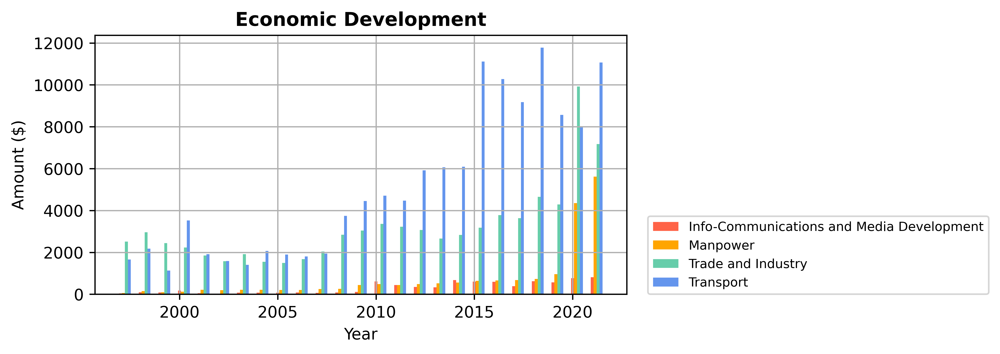

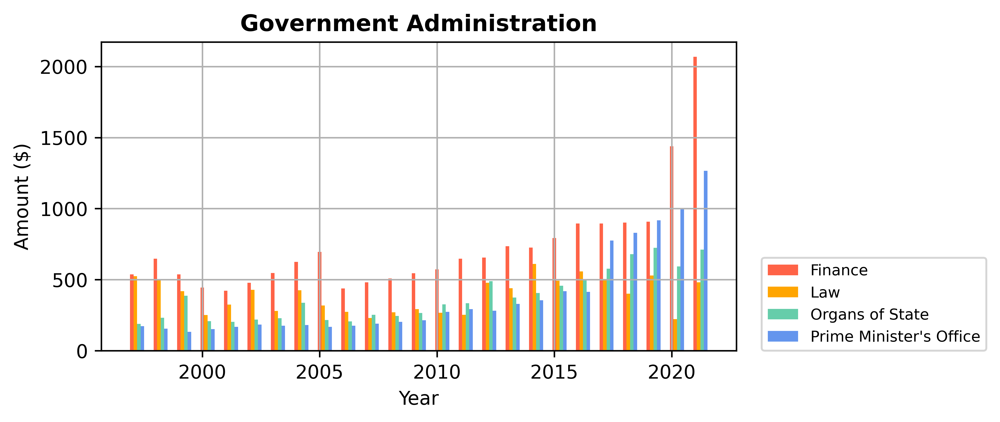

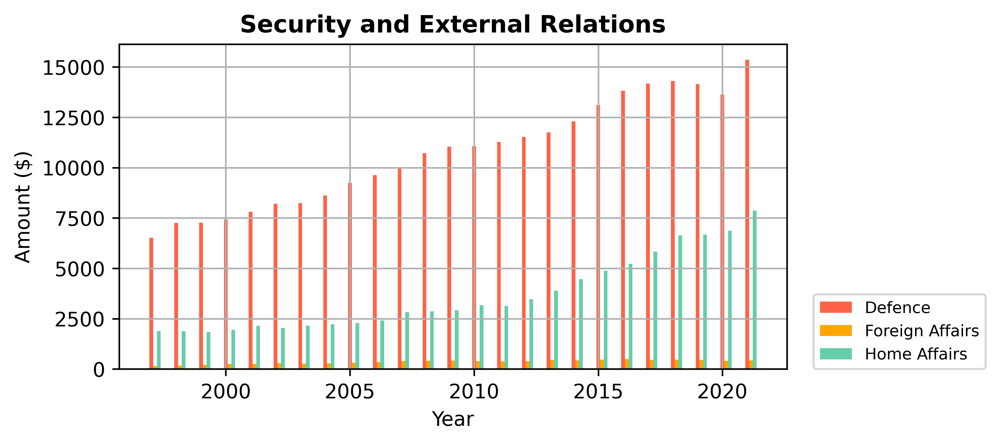

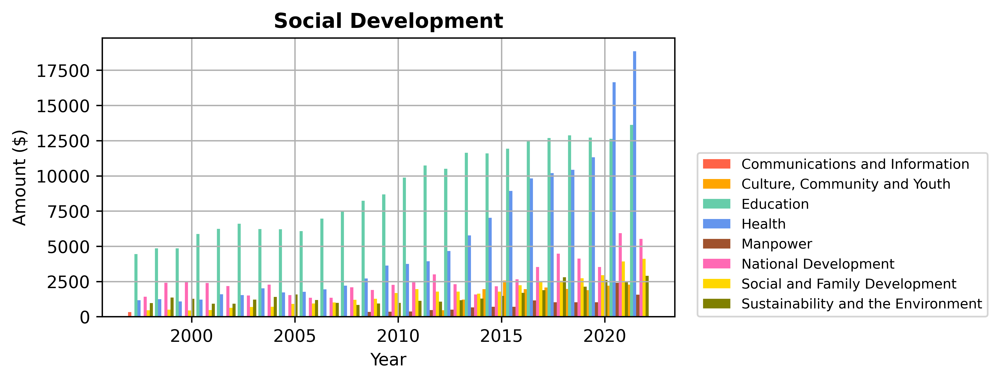

In [39]:
charts("Economic Development")
charts("Government Administration")
charts("Security and External Relations")
charts("Social Development")

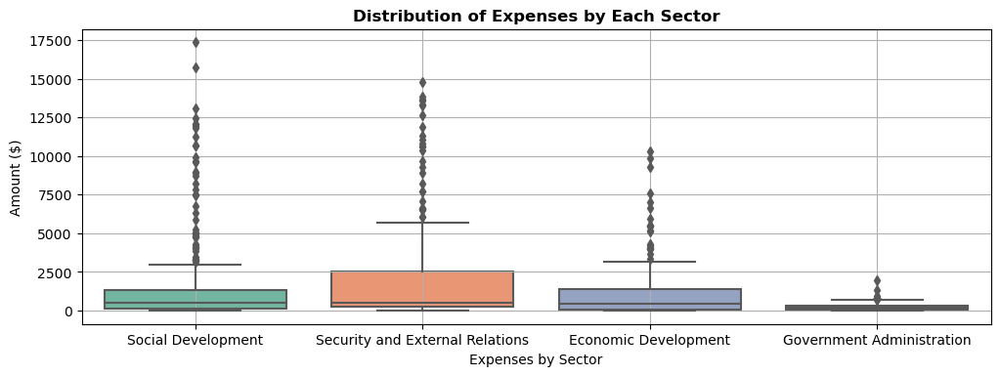

In [40]:
figure(figsize=(12,4), dpi=100)
sns.boxplot(x=total_expenditure.sector, y=total_expenditure.amount, 
            data=total_expenditure,palette="Set2")
plt.ylabel("Amount ($)")
plt.xlabel("Expenses by Sector")
plt.ticklabel_format(style='plain', axis='y')
plt.grid()
plt.title("Distribution of Expenses by Each Sector",fontweight="bold")
plt.savefig('Distribution of Expenses by Each Sector.png', dpi=100, format='png',bbox_inches="tight",facecolor='w', edgecolor='w')

In [41]:
#Manpower for govt administration

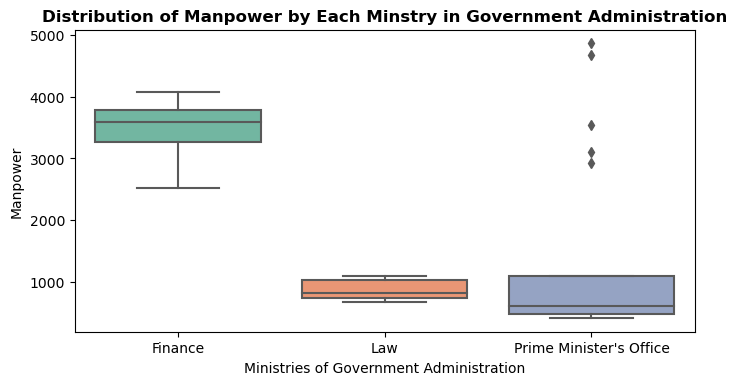

In [42]:
GAS=total_expenditure[total_expenditure['sector']=="Government Administration"].ministry
GA_ministry=np.unique(GAS)
GA_ministry=govt_manpower[(govt_manpower["ministry"]=="Finance")|(govt_manpower["ministry"]=="Law")|(govt_manpower["ministry"]=="Organs of State")|(govt_manpower["ministry"]=="Prime Minister's Office")].ministry
GA_numbers_manpower=govt_manpower[(govt_manpower["ministry"]=="Finance")|(govt_manpower["ministry"]=="Law")|(govt_manpower["ministry"]=="Organs of State")|(govt_manpower["ministry"]=="Prime Minister's Office")].number
df_6 = pd.DataFrame({"GA_Ministry": GA_ministry, "Numbers": GA_numbers_manpower})
figure(figsize=(8,4), dpi=100)
sns.boxplot(x=df_6.GA_Ministry, y=df_6.Numbers, 
            data=df_6,palette="Set2")
plt.ylabel("Manpower")
plt.xlabel("Ministries of Government Administration")
plt.ticklabel_format(style='plain', axis='y')
plt.title("Distribution of Manpower by Each Minstry in Government Administration",fontweight="bold")
plt.savefig('Distribution of Manpower by Each Minstry in Government Administration.png', dpi=100, format='png',bbox_inches="tight",facecolor='w', edgecolor='w')

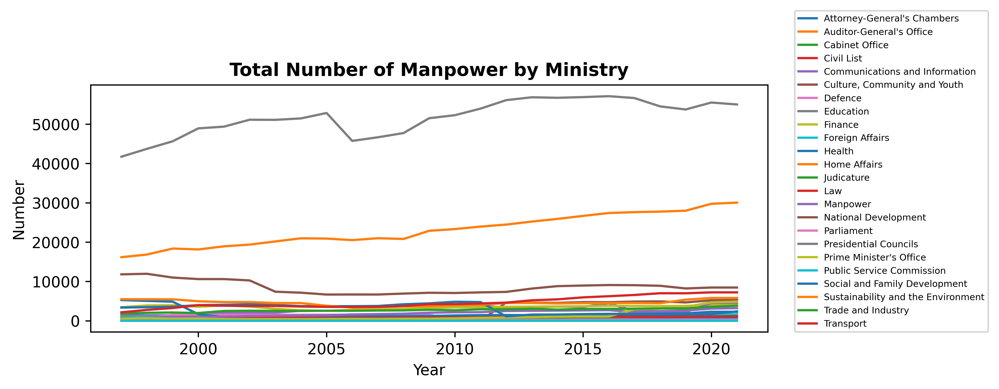

In [43]:
x = np.array(govt_manpower["financial_year"])
x_axis=np.unique(x)
m=govt_manpower.ministry
manpower_ministry=np.unique(m)
figure(figsize=(8,3), dpi=600)
ministry_list=[]
for i in manpower_ministry:
    k=govt_manpower[govt_manpower["ministry"]==i].groupby("financial_year")["number"].sum()
    ministry_list.append(k)
mycolors = ['tomato', 'orange', 'mediumaquamarine', 'cornflowerblue', 'sienna', 'hotpink', 'gold', 'olive']
width=1.0
for j in range(0,len(ministry_list),1):
    plt.plot(ministry_list[j],label=manpower_ministry[j])
    width+=0.2
plt.title('Total Number of Manpower by Ministry',fontweight="bold")
plt.xlabel('Year')
plt.ylabel('Number')
plt.legend(loc=(1.04,0),fontsize=6)
plt.savefig('Total Number of Manpower by Ministry.png', dpi=600, format='png',bbox_inches="tight",facecolor='w', edgecolor='w')
plt.show()


# Question 5: Provide Insights on the impacts of the budget allocation to Singapore’s economic growth.

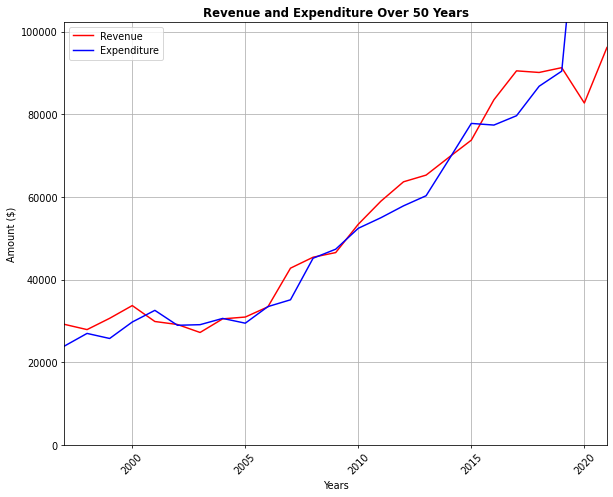

In [44]:
yearly_revenue=fiscal_position[fiscal_position["category"]=="Revenue"].groupby("year_of_balance")["amount"].sum()
yearly_expenditure=fiscal_position[fiscal_position["category"]=="Expenditure"].groupby("year_of_balance")["amount"].sum()
figure(figsize=(10, 8), dpi=70)
plt.plot(yearly_revenue, 
         'r-', 
         label='Revenue')
plt.plot(yearly_expenditure,
         'b-', 
         label='Expenditure')
plt.title('Revenue and Expenditure Over 50 Years',fontweight="bold")
plt.xlabel('Years')
plt.ylabel('Amount ($)')
plt.axis([x_axis.min(),x_axis.max(),0,fiscal_position.amount.max()]) # use these to set the upper and lower limits
plt.legend()
plt.xticks(rotation=45)
plt.grid()
plt.show()

## Plotting Scatter Plot to Examine Correlation Between Yearly Expenditure and Revenue

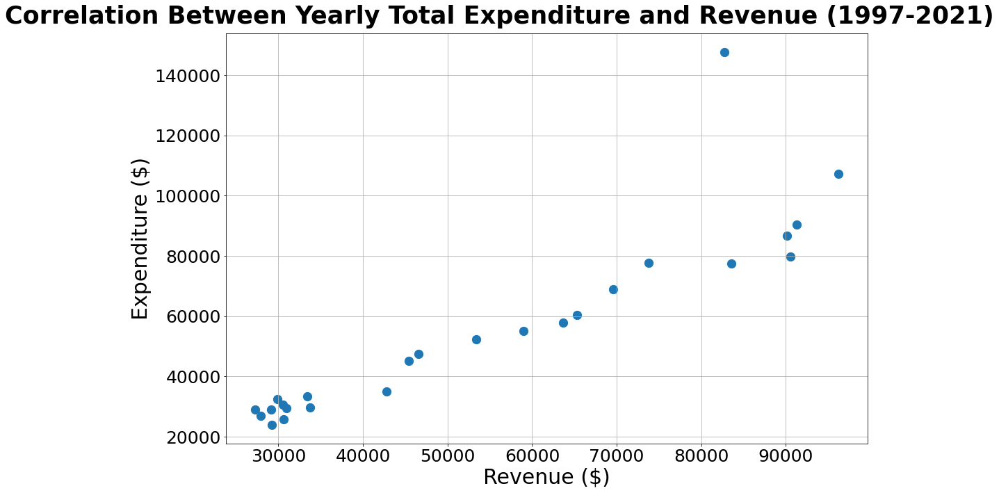

In [48]:
plt.figure(figsize=(15,10))
plt.scatter(fiscal_position[fiscal_position["category"]=="Revenue"].groupby("year_of_balance")["amount"].sum(),fiscal_position[fiscal_position["category"]=="Expenditure"].groupby("year_of_balance")["amount"].sum(),s=150)
plt.suptitle("Correlation Between Yearly Total Expenditure and Revenue (1997-2021)",fontsize=35,weight="bold")
plt.xlabel("Revenue ($)",fontsize=30)
plt.ylabel("Expenditure ($)",fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.grid()
plt.tight_layout();

## Plotting Scatter Plot to Examine Correlation Between Overall Balance and Percentage of GDP

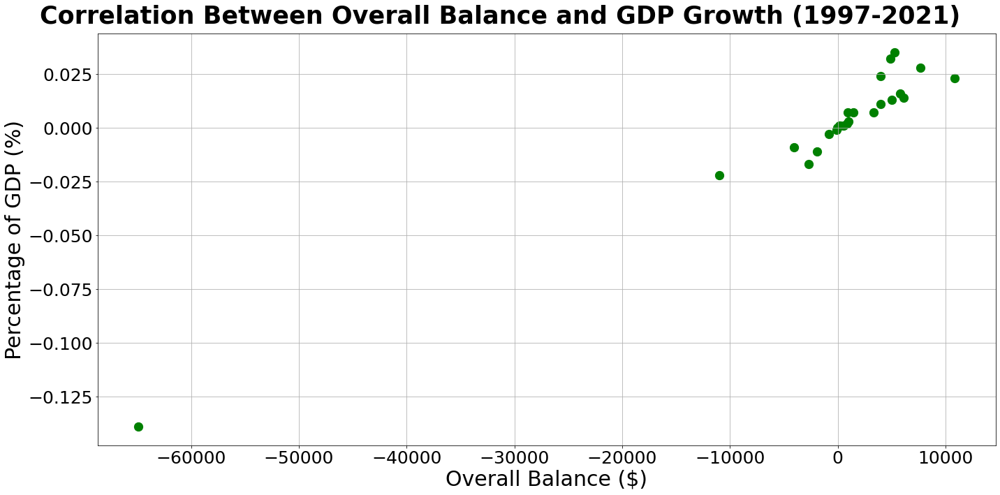

In [46]:
plt.figure(figsize=(20,10))
plt.scatter(fiscal_position[fiscal_position["item"]=="Overall Balance"]["amount"],fiscal_position[fiscal_position["item"]=="Overall Balance"]["percent_of_gdp"],color="green",s=150)
plt.suptitle("Correlation Between Overall Balance and GDP Growth (1997-2021)",fontsize=35,weight="bold")
plt.xlabel("Overall Balance ($)",fontsize=30)
plt.ylabel("Percentage of GDP (%)",fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.grid()
plt.tight_layout();

In [47]:
# Finding the anomaly
yearly_overall_balance = fiscal_position[fiscal_position["item"]=="Overall Balance"][["year_of_balance","amount"]]
yearly_overall_balance.sort_values("amount").head()

,year_of_balance,amount
198,2020,-64895
199,2021,-11010
193,2015,-4050
179,2001,-2698
181,2003,-1887
